In [1]:
import pandas as pd
import sqlite3
import os 
import numpy as np
"""Connect to the sql database"""
database_path = "crimes.db"
assert(os.path.exists(database_path)), "this notebook requires create_sql...py to have been run"
db = sqlite3.connect(database_path)
cur = db.cursor()
"""Read to dataframe"""
df = pd.read_sql("""SELECT * 
                FROM crimes
                WHERE "LSOA_name" LIKE 'Barnet%'
                AND "Crime_type" LIKE 'Burglary'""", con=db)
cur.close()
df


,Crime_ID,Month,Reported_by,Falls_within,Longitude,Latitude,Location,LSOA_code,LSOA_name,Crime_type,Last_outcome_category,Context
0,,2010-12,Metropolitan Police Service,Metropolitan Police Service,-0.201877,51.655538,On or near High Street,E01000248,Barnet 001A,Burglary,,
1,,2010-12,Metropolitan Police Service,Metropolitan Police Service,-0.207853,51.654317,On or near The Avenue,E01000248,Barnet 001A,Burglary,,
2,,2010-12,Metropolitan Police Service,Metropolitan Police Service,-0.202510,51.656348,On or near Bruce Road,E01000248,Barnet 001A,Burglary,,
3,,2010-12,Metropolitan Police Service,Metropolitan Police Service,-0.206779,51.654768,On or near The Drive,E01000248,Barnet 001A,Burglary,,
4,,2010-12,Metropolitan Police Service,Metropolitan Police Service,-0.209537,51.655223,On or near Marriott Road,E01000249,Barnet 001B,Burglary,,
...,...,...,...,...,...,...,...,...,...,...,...,...
44187,fda0870be993d2c9352ae14a540bf529c15a7aa9d92a4e...,2023-03,Metropolitan Police Service,Metropolitan Police Service,-0.202163,51.559100,On or near Hocroft Road,E01000139,Barnet 041B,Burglary,Under investigation,
44188,c6c2d9a772695865f4ca33fce59c26c48fe3a1cdac8c22...,2023-03,Metropolitan Police Service,Metropolitan Police Service,-0.202163,51.559100,On or near Hocroft Road,E01000139,Barnet 041B,Burglary,Under investigation,
44189,e5bab2bd4f31de44515dbf125b85284392d0349139a1d3...,2023-03,Metropolitan Police Service,Metropolitan Police Service,-0.197843,51.561093,On or near Church Walk,E01000140,Barnet 041C,Burglary,Under investigation,
44190,823465427f8764e250a48312715a4bd87e8012412046c6...,2023-03,Metropolitan Police Service,Metropolitan Police Service,-0.199449,51.563896,On or near Llanelly Road,E01000140,Barnet 041C,Burglary,Under investigation,


In [2]:
### Structure data to burglaries per month per LSOA

LSOA_list = df["LSOA_code"].unique()
months = np.array(df["Month"].unique())
months.sort()
monthly_dataframes = []
for cur_month in months:
    df_month  = df[df["Month"] == cur_month].copy()
    
    # prevent counting same crime id twice
    df_month = df_month[["LSOA_code", "Crime_ID"]].drop_duplicates().groupby("LSOA_code").count()
    df_month = df_month.reindex(LSOA_list).fillna(0)
    df_month = df_month.rename(columns={"Crime_ID": cur_month})    
    monthly_dataframes.append(df_month)

# Concatenate the monthly dataframes into a single dataframe
df_LSOA_per_month = pd.concat(monthly_dataframes, axis=1)


df_LSOA_per_month = df_LSOA_per_month.reindex(sorted(df_LSOA_per_month.columns), axis=1).sort_index()
df_LSOA_per_month

,2010-12,2011-01,2011-02,2011-03,2011-04,2011-05,2011-06,2011-07,2011-08,2011-09,...,2022-06,2022-07,2022-08,2022-09,2022-10,2022-11,2022-12,2023-01,2023-02,2023-03
LSOA_code,,,,,,,,,,,,,,,,,,,,,
E01000115,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,3.0,1.0,0.0,0.0,1.0,0.0,3.0
E01000116,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,...,0.0,0.0,0.0,1.0,2.0,0.0,0.0,0.0,2.0,1.0
E01000117,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0
E01000118,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,2.0,0.0,1.0,0.0,1.0,0.0,2.0
E01000119,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,...,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
E01000322,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,...,0.0,2.0,0.0,1.0,0.0,2.0,2.0,0.0,2.0,1.0
E01000323,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,0.0,0.0,0.0,1.0,4.0,0.0,0.0,0.0,0.0
E01000324,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,4.0,2.0,0.0,1.0,0.0,0.0


# KDE across all of Barnet


In [3]:
import datetime
from sklearn.preprocessing import normalize
df["Date"] = pd.to_datetime(df["Month"])
df_train = df[df["Date"] < "2023-03"]
df_test  = df[df["Date"] >= "2023-03"]



X = df_train[["Latitude", "Longitude"]].to_numpy()
Y = df_test[["Latitude", "Longitude"]].to_numpy()
print(X.shape)
print(Y.shape)
X_mean = np.mean(X, axis=0)
X_std  = np.std(X, axis=0)
# normalize lat and longitude
X = (X - X_mean) / X_std
Y = (Y - X_mean) / X_std
X

(43960, 2)
(232, 2)


array([[ 1.9656366 ,  0.07733949],
       [ 1.91698993, -0.08983326],
       [ 1.99790835,  0.05963193],
       ...,
       [-1.84852562, -0.11915004],
       [-1.88071769, -0.12046482],
       [-1.88071769, -0.12046482]])

checking performance of  100  different bandwidth models
1.2.3.4.5.6.7.8.9.10.11.12.13.14.15.16.17.18.19.20.21.22.23.24.25. 
26.27.28.29.30.31.32.33.34.35.36.37.38.39.40.41.42.43.44.45.46.47.48.49.50. 
51.52.53.54.55.56.57.58.59.60.61.62.63.64.65.66.67.68.69.70.71.72.73.74.75. 
76.77.78.79.80.81.82.83.84.85.86.87.88.89.90.91.92.93.94.95.96.97.98.99.100. 


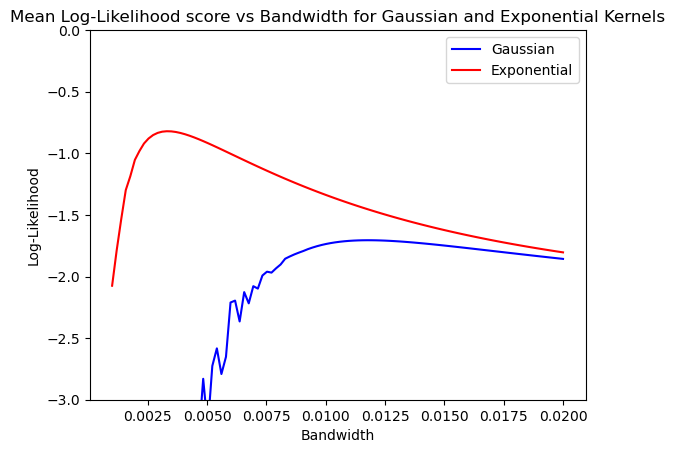

In [4]:
"""Test different kernels and bandwidths"""

# get performance and plot it 
import matplotlib.pyplot as plt
from sklearn.neighbors import KernelDensity

# candwidth values to test
bandwidths = np.linspace(0.001, 0.02, 100)

gaussian_scores = []
exponential_scores = []
tophat_scores =[]
linear_scores = []
cosine_scores =[]

# calculate mean scores for different bandwidths
L = len(bandwidths)
print("checking performance of ", L, " different bandwidth models")
for idx in range(0, L):
    bandwidth = bandwidths[idx]
    kde_gaussian = KernelDensity(kernel='gaussian', bandwidth=bandwidth).fit(X)
    gaussian_scores.append(kde_gaussian.score_samples(Y).mean())

    kde_exponential = KernelDensity(kernel='exponential', bandwidth=bandwidth).fit(X)
    exponential_scores.append(kde_exponential.score_samples(Y).mean())
    print(idx+1,end=".")
    if (idx+1) % 25 == 0:
        print(" ")

                            
# Plotting the mean scores
plt.plot(bandwidths, gaussian_scores, color='blue', label='Gaussian')
plt.plot(bandwidths, exponential_scores, color='red', label='Exponential')
plt.xlabel('Bandwidth')
plt.ylabel('Log-Likelihood')
plt.title('Mean Log-Likelihood score vs Bandwidth for Gaussian and Exponential Kernels')
plt.legend()
plt.ylim(-3, 0)
plt.show()

In [5]:
idx1 = np.argmax(gaussian_scores)
idx2 = np.argmax(exponential_scores)

print("score: ",  gaussian_scores[idx1], "\n",
      "  bandwith: ", bandwidths[idx1])
print("score: ", exponential_scores[idx2], "\n",
      "  bandwith: ", bandwidths[idx2])

score:  -1.705437748534379 
   bandwith:  0.011747474747474746
score:  -0.8207354058745979 
   bandwith:  0.003303030303030303


# Visualizing best KDE

In [24]:
best_KDE = KernelDensity(kernel='gaussian', bandwidth=0.011747474747474746).fit(X)
density_sample1 = best_KDE.sample(100000, random_state=0)
# undo normalization
density_sample1 = density_sample1 * X_std + X_mean

In [25]:
from scipy import stats
import numpy as np
import pandas as pd
import geopandas as gpd
import seaborn as sns
import plotly.express as px


fig = px.scatter_mapbox(lat=density_sample1[:, 0], lon=density_sample1[:, 1], 
                        zoom = 11,
                        opacity = 0.025,
                        mapbox_style="open-street-map",
                        range_color = [1,8],
                       height=700, width=700)
fig.update_layout(title_text="Relative density of KDE for entirety of Barnet",  # Set the title of the plot
                  coloraxis_colorbar_title="Label")  # Set the label for the color scale
fig.show()

